# Optimising School Infrastructure Planning

**Authored by**:  Linh Huong Nguyen

**Duration**: 90 mins

**Level**: Intermediate

**Pre-requisite Skills**: Python, Pandas, Matplotlib, NumbPy, Seaborn, Scikit-learn


### Scenario

As a government policymaker in the education sector, I want to predict future school enrollment trends and optimize school locations, so that I can ensure efficient resource allocation, avoid overcrowding, and provide access to education in growing communities.

### What this use case will teach you

At the end of this use case, you will have demonstrated the following skills:

- Extracted and imported datasets from open data portals for analysis using APIs.

- Conducted data cleaning and preprocessing to ensure data quality and consistency.

- Performed exploratory data analysis (EDA) to uncover trends, patterns, and anomalies.

- Utilized clustering algorithms to segment regions or data points based on relevant features.

- Applied advanced machine learning and statistical methods to evaluate clustering outcomes and derive meaningful insights.

### Background and Introduction

The rapidly changing demographic landscape and the ongoing shifts in population density pose significant challenges for governments and policymakers in the education sector. As populations grow and migrate, ensuring that educational infrastructure keeps pace with demand is critical. This use case addresses the need for data-driven decision-making in the planning and optimization of school locations and enrollment projections. By using population forecast by small areas, future school enrollment trends can be identified and schools placements can be strategically made to meet these demands. By using school locations dataset and population forecast by small area dataset, policymakers can make informed decisions that optimize resource distribution, avoid overcrowding in existing schools, and ensure that educational opportunities are accessible to all students, especially in rapidly growing communities.

The overarching objective of this use case is to empower education departments with the tools and insights needed to plan for the future, ensuring that resources are allocated efficiently and effectively while providing equitable access to education for all students. Through strategic school placement and thoughtful infrastructure planning, this use case supports the long-term sustainability of the educational system in response to evolving community needs.

### Datasets used


- [2024 School Locations](https://discover.data.vic.gov.au/dataset/school-locations-2024) <br>
This dataset contains list of all school locations in Victoria. Includes primary and secondary schools, government and non-government. Information collected as part of the ongoing registration of schools. School details include name, school sector, school type, address, phone, region and area. Also included is the departmental region and area which are both based on the school administration campus. This dataset is sourced from the Victoria Department of Education and can be accessed via API V2.1.

- [City of Melbourne Population Forecasts by Small Area 2023-2043](https://data.melbourne.vic.gov.au/explore/dataset/city-of-melbourne-population-forecasts-by-small-area-2020-2040/information/)<br>
This dataset provides population forecasts by single year for 2023 to 2043, divided into genders age group and geography distribution. This dataset is sourced from the Melbourne Open Data website using API V2.1.

- [Small Areas for Census of Land Use and Employment (CLUE)](https://data.melbourne.vic.gov.au/explore/dataset/small-areas-for-census-of-land-use-and-employment-clue/information/) <br>
This dataset contains spatial layer of small areas used for the City of Melbourne's Census Of Land Use And Employment (CLUE) analysis. This dataset is used to provide detailed locations for the This dataset is sourced from the Melbourne Open Data website using API V2.1.


### Importing Datasets

This section imports essential libraries for data manipulation, visualization, geospatial analysis, interactive mapping, and fetching data from APIs. These libraries provide the necessary functionality for processing, analyzing, and visualizing the project data effectively.

In [25]:
import requests
import pandas as pd
import os
from io import StringIO
import requests
import seaborn as sns
import folium
import matplotlib.pyplot as plt

### Loading the datasets using API 2.1v

This section defines functions for fetching data from APIs. The API_Unlimited function retrieves datasets from the Melbourne Open Data Portal using dataset IDs, processes the data into a DataFrame, and provides a preview for verification. Similarly, the fetch_data_from_url function fetches data directly from a given URL, processes it into a DataFrame, and displays a sample for validation. These functions enable seamless access to external datasets for analysis.

In [3]:
def API_Unlimited(datasetname): # pass in dataset name and api key
    dataset_id = datasetname

    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    #apikey = api_key
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}/exports/{format}'
    
    params = {
        'select': '*',
        'limit': -1,  # all records
        'lang': 'en',
        'timezone': 'UTC'
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # StringIO to read the CSV data
        url_content = response.content.decode('utf-8')
        datasetname = pd.read_csv(StringIO(url_content), delimiter=';')
        print(datasetname.sample(10, random_state=999)) # Test
        return datasetname 
    else:
        return (print(f'Request failed with status code {response.status_code}'))

In [4]:
def API_Unlimited_external(datasetname): # pass in dataset name and api key
    dataset_id = datasetname

    base_url = 'https://www.education.vic.gov.au/Documents/about/research/datavic/'
    #apikey = api_key
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}.{format}'
    params = {
        'select': '*',
        'limit': -1,  # all records
        'lang': 'en',
        'timezone': 'UTC'
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # StringIO to read the CSV data
        url_content = response.text
        datasetname = pd.read_csv(StringIO(url_content), delimiter=',')
        print(datasetname.sample(10, random_state=999)) # Test
        return datasetname 
    else:
        return (print(f'Request failed with status code {response.status_code}'))



### Fetching and Previewing Datasets

This section defines the dataset download links required for the use case and fetches the corresponding data using the API_Unlimited function. The datasets include coworking spaces, business establishment details, tram stops and metro train stations which are essential for creating a map of all coworking spaces and nearby amenities. After retrieval, the code displays the first few rows of each dataset to confirm successful loading and ensure data integrity.

In [5]:
download_link_1 = 'city-of-melbourne-population-forecasts-by-small-area-2020-2040'
download_link_2 = 'small-areas-for-census-of-land-use-and-employment-clue'
download_link_3 = 'dv378_DataVic-SchoolLocations-2024'

# Use functions to download and load data
population_forecasts = API_Unlimited(download_link_1)
small_areas = API_Unlimited(download_link_2)
school_locations = API_Unlimited_external(download_link_3)

                          geography  year  gender        age  value
9869                      Southbank  2028  Female    Age 0-4    547
1234                Melbourne (CBD)  2039    Male  Age 75-79    360
7339                        Carlton  2024  Female  Age 15-19   1046
6302                    South Yarra  2042    Male  Age 65-69     99
6867   West Melbourne (Residential)  2026    Male  Age 70-74     73
1211                Melbourne (CBD)  2038  Female  Age 55-59    609
9875                      Southbank  2028    Male  Age 30-34   3271
10449  West Melbourne (Residential)  2037  Female  Age 15-19    173
8939                North Melbourne  2032  Female  Age 65-69    218
1160                Melbourne (CBD)  2035  Female  Age 20-24   9716
                               geo_point_2d  \
2    -37.83760704949379, 144.98292521995853   
4     -37.79152998205382, 144.9204996881507   
11    -37.81851829412262, 144.9416850851487   
6    -37.81381109987871, 144.96291513859617   
12     -37.796011

### Displaying Dataset Overview

This part of the code verifies the datasets by displaying their dimensions and a preview of the first few rows. It ensures that the datasets have been successfully loaded and are ready for analysis. 

In [6]:
print(population_forecasts.head())
print(population_forecasts.info())

  geography  year  gender        age  value
0   Carlton  2023  Female  Age 40-44    343
1   Carlton  2023  Female    Age 5-9    203
2   Carlton  2023  Female  Age 55-59    250
3   Carlton  2023  Female  Age 65-69    224
4   Carlton  2023  Female  Age 75-79    121
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10584 entries, 0 to 10583
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   geography  10584 non-null  object
 1   year       10584 non-null  int64 
 2   gender     10584 non-null  object
 3   age        10584 non-null  object
 4   value      10584 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 413.6+ KB
None


In [7]:
print(small_areas.head())
print(small_areas.info())

                             geo_point_2d  \
0   -37.78711656492933, 144.9515603312268   
1  -37.82529018627908, 144.96176162794978   
2  -37.83760704949379, 144.98292521995853   
3  -37.814581164837946, 144.9825008488323   
4   -37.79152998205382, 144.9204996881507   

                                           geo_shape      featurenam  \
0  {"coordinates": [[[[144.94036533536232, -37.78...       Parkville   
1  {"coordinates": [[[[144.95599687351128, -37.82...       Southbank   
2  {"coordinates": [[[[144.98502208625717, -37.84...     South Yarra   
3  {"coordinates": [[[[144.9732217743585, -37.807...  East Melbourne   
4  {"coordinates": [[[[144.936867787351, -37.7888...      Kensington   

     shape_area    shape_len  
0  4.050997e+06  9224.569397  
1  1.596010e+06  6012.377239  
2  1.057773e+06  5424.136446  
3  1.909073e+06  6557.914249  
4  3.808797e+06  9407.055421  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13 entries, 0 to 12
Data columns (total 5 columns):
 #   Col

In [8]:
print(school_locations.head())
print(school_locations.info())

  Education_Sector  Entity_Type  School_No                    School_Name  \
0         Catholic            2         20                 Parade College   
1         Catholic            2         25       Simonds Catholic College   
2         Catholic            2         26    St Mary’s College Melbourne   
3         Catholic            2         28  St Patrick's College Ballarat   
4         Catholic            2         29            St Patrick's School   

  School_Type             Address_Line_1 Address_Line_2    Address_Town  \
0   Secondary           1436 Plenty Road            NaN        BUNDOORA   
1   Secondary        273 Victoria Street            NaN  WEST MELBOURNE   
2   Secondary         11 Westbury Street            NaN   ST KILDA EAST   
3   Secondary          1431 Sturt Street            NaN        BALLARAT   
4     Primary  119 Drummond Street South            NaN        BALLARAT   

  Address_State  Address_Postcode  ...     Postal_Town Postal_State  \
0           VIC

### Data Cleaning and Processing

#### Check for missing values and Duplicate Values

This section performs a data quality check by identifying missing values and duplicate rows in the coworking spaces, business establishments, tram stops and metro train stations datasets. This helps ensure the data is clean and ready for further analysis by highlighting potential issues that need to be addressed.

- Population Forecast Dataset

In [9]:
# Check if there are any missing values in the datasets
print(population_forecasts.isnull().sum())

#Check if there are any duplicates in the datasets
print(f"\nDuplicate rows in Population Forecast Dataset: {population_forecasts.duplicated().sum()}\n")  # Check for duplicates in the dataset and print the count of duplicates.

geography    0
year         0
gender       0
age          0
value        0
dtype: int64

Duplicate rows in Population Forecast Dataset: 0



- Small Areas Dataset

In [10]:
# Check if there are any missing values in the datasets
print(small_areas.isnull().sum())

#Check if there are any duplicates in the datasets
print(f"\nDuplicate rows in Small Areas Dataset: {small_areas.duplicated().sum()}\n")  # Check for duplicates in the dataset and print the count of duplicates.

geo_point_2d    0
geo_shape       0
featurenam      0
shape_area      0
shape_len       0
dtype: int64

Duplicate rows in Small Areas Dataset: 0



- School Locations Dataset

In [11]:
# Check if there are any missing values in the datasets
print(school_locations.isnull().sum())

#Check if there are any duplicates in the datasets
print(f"\nDuplicate rows in School Locations Dataset: {school_locations.duplicated().sum()}\n")  # Check for duplicates in the dataset and print the count of duplicates.

Education_Sector            0
Entity_Type                 0
School_No                   0
School_Name                 0
School_Type                 0
Address_Line_1              0
Address_Line_2           2283
Address_Town                0
Address_State               0
Address_Postcode            0
Postal_Address_Line_1       2
Postal_Address_Line_2    2280
Postal_Town                 2
Postal_State                2
Postal_Postcode             2
Full_Phone_No               0
Region_Name                 0
AREA_Name                   0
LGA_ID                      0
LGA_Name                    0
X                           1
Y                           1
dtype: int64

Duplicate rows in School Locations Dataset: 0



#### Handling Missing and Duplicate Data

This section addresses missing values in the school locations dataset by removing irrelevant and redundant columns

#### Removing unnecessary columns

In [12]:
school_clean=school_locations.drop(columns=['Address_Line_2','Entity_Type','Postal_Address_Line_1','Postal_Address_Line_2','Postal_Town','Postal_State','Postal_Postcode','LGA_ID','LGA_Name'])

#### Handling missing values

In [13]:
# Check if there are any missing values in the two datasets
print(school_clean.isnull().sum())
print(population_forecasts.isnull().sum())
print(small_areas.isnull().sum())


Education_Sector    0
School_No           0
School_Name         0
School_Type         0
Address_Line_1      0
Address_Town        0
Address_State       0
Address_Postcode    0
Full_Phone_No       0
Region_Name         0
AREA_Name           0
X                   1
Y                   1
dtype: int64
geography    0
year         0
gender       0
age          0
value        0
dtype: int64
geo_point_2d    0
geo_shape       0
featurenam      0
shape_area      0
shape_len       0
dtype: int64


In [14]:
school_clean = school_clean.dropna(subset=['X', 'Y'])


#### Merge Datasets

As the Population Forecasting dataset does not contain information of longtitude and latitude for each small area, this dataset is merged with Small Area dataset (CLUE) for further use of visualisation tools.

In [23]:
population_forecasts['geography'].unique()

array(['Carlton', 'Docklands', 'East Melbourne', 'Kensington',
       'Melbourne (CBD)', 'Melbourne (Remainder)', 'North Melbourne',
       'Parkville', 'Port Melbourne', 'South Yarra', 'Southbank',
       'West Melbourne (Industrial)', 'West Melbourne (Residential)',
       'City of Melbourne'], dtype=object)

In [17]:
small_areas

,geo_point_2d,geo_shape,featurenam,shape_area,shape_len
0,"-37.78711656492933, 144.9515603312268","{""coordinates"": [[[[144.94036533536232, -37.78...",Parkville,4.050997e+06,9224.569397
1,"-37.82529018627908, 144.96176162794978","{""coordinates"": [[[[144.95599687351128, -37.82...",Southbank,1.596010e+06,6012.377239
2,"-37.83760704949379, 144.98292521995853","{""coordinates"": [[[[144.98502208625717, -37.84...",South Yarra,1.057773e+06,5424.136446
3,"-37.814581164837946, 144.9825008488323","{""coordinates"": [[[[144.9732217743585, -37.807...",East Melbourne,1.909073e+06,6557.914249
4,"-37.79152998205382, 144.9204996881507","{""coordinates"": [[[[144.936867787351, -37.7888...",Kensington,3.808797e+06,9407.055421
5,"-37.808460189256294, 144.94942867521925","{""coordinates"": [[[[144.95143788598978, -37.81...",West Melbourne (Residential),8.600547e+05,4031.467993
6,"-37.81381109987871, 144.96291513859617","{""coordinates"": [[[[144.95143788598978, -37.81...",Melbourne (CBD),2.485905e+06,7112.609871
7,"-37.828764031547315, 144.97838992382978","{""coordinates"": [[[[144.98502208625717, -37.84...",Melbourne (Remainder),2.668301e+06,11399.608246
8,"-37.79844895689088, 144.94506274103145","{""coordinates"": [[[[144.95732229939304, -37.80...",North Melbourne,2.408377e+06,7546.649191
9,"-37.809621301586795, 144.9221537804208","{""coordinates"": [[[[144.91999182740727, -37.81...",West Melbourne (Industrial),5.917883e+06,11793.960449


### Data Exploration and Visualization

#### Visualization of School locations

In [15]:
# Import folium and create a map centered on Melbourne
import folium

# Average lat/lon for center
melbourne_center = [school_clean['Y'].mean(), school_clean['X'].mean()]
school_map = folium.Map(location=melbourne_center, zoom_start=13)

# Add coworking space markers
for _, row in school_clean.iterrows():
    folium.Marker(
        location=[row['Y'], row['X']],
        tooltip=f"<b>{row['School_Name']}</b><br>{row['School_Type']}<br>{row['Address_Line_1']}",
        icon=folium.Icon(color='blue', icon='briefcase', prefix='fa')
    ).add_to(school_map)

# Display the map
school_map


#### Visualisation of Population Forecase dataset

- By small areas

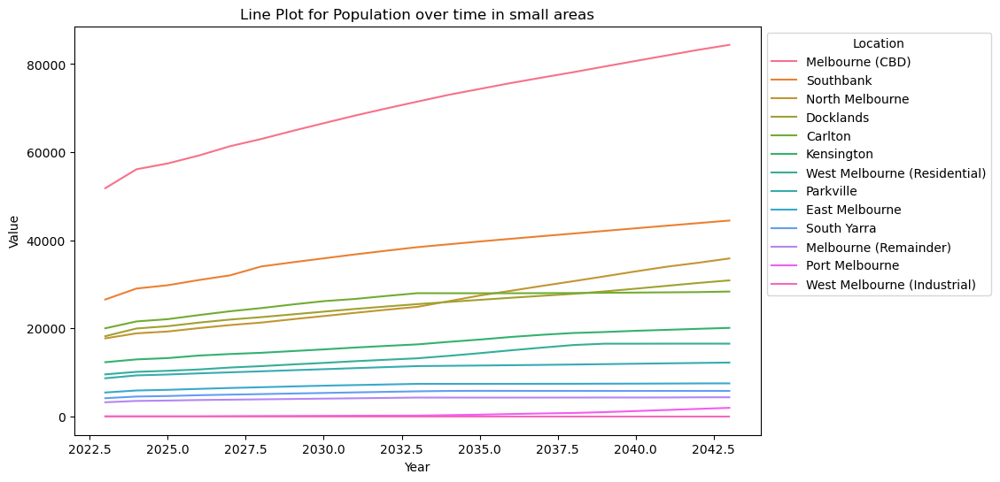

In [46]:
population_forecasts_by_area = population_forecasts[population_forecasts['geography']!='City of Melbourne']
population_forecasts_by_area_agg = population_forecasts_by_area.groupby(['geography','year'])['value'].sum().reset_index().sort_values(by='value',ascending=False)
plt.figure(figsize=(10,6))
plot= sns.lineplot(data=population_forecasts_by_area_agg, x='year', y='value', hue='geography')
plt.title('Line Plot for Population over time in small areas')
plt.xlabel('Year')
plt.ylabel('Value')
plt.legend(title='Location')
sns.move_legend(plot, "upper left", bbox_to_anchor=(1, 1))

- By age group

<Figure size 1400x800 with 0 Axes>

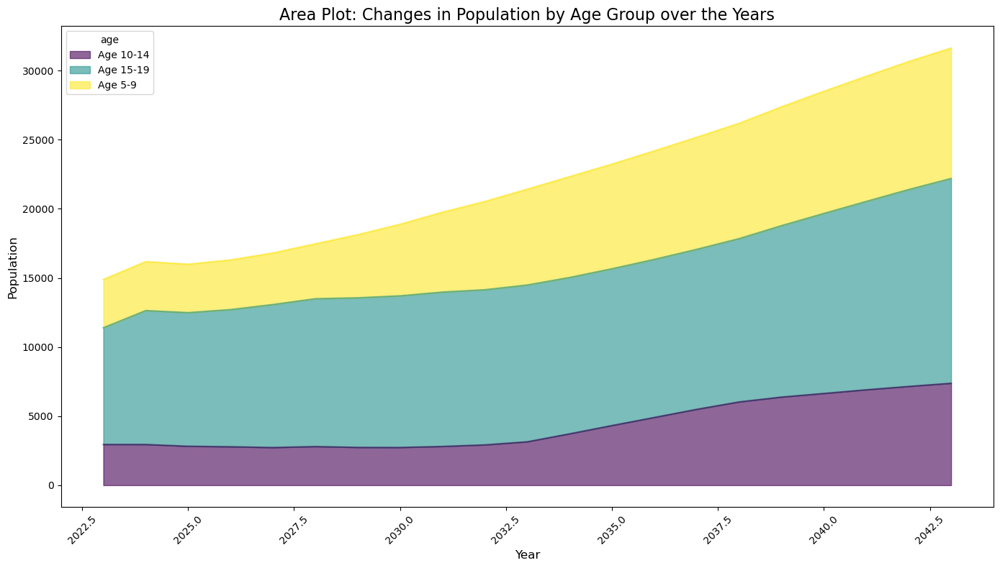

In [56]:
relevant_age_groups = ['Age 5-9', 'Age 10-14', 'Age 15-19']
population_forecasts_COM = population_forecasts[population_forecasts['geography']!='City of Melbourne']
population_age_groups = population_forecasts_COM[population_forecasts_COM['age'].isin(relevant_age_groups)]

area_plot_data = population_age_groups.pivot_table(values='value', index='year', columns='age', aggfunc='sum')

# Plot the area plot
plt.figure(figsize=(14, 8))
area_plot_data.plot(kind='area', stacked=True, alpha=0.6, figsize=(14, 8), cmap='viridis')

# Add titles and labels
plt.title('Area Plot: Changes in Population by Age Group over the Years', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Population', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [61]:
small_areas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13 entries, 0 to 12
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   geo_point_2d  13 non-null     object 
 1   geo_shape     13 non-null     object 
 2   featurenam    13 non-null     object 
 3   shape_area    13 non-null     float64
 4   shape_len     13 non-null     float64
dtypes: float64(2), object(3)
memory usage: 652.0+ bytes


In [62]:

import json
from shapely.geometry import shape

# Extract latitude and longitude from 'Geo Point' and convert them to float
small_areas[['Latitude', 'Longitude']] = small_areas['geo_point_2d'].str.split(',', expand=True)
small_areas['Latitude'] = small_areas['Latitude'].astype(float)
small_areas['Longitude'] = small_areas['Longitude'].astype(float)

# Initialize the Folium map centered around Melbourne
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

# Loop through each row in the clue dataset and add polygons based on 'Geo Shape'
for _, row in small_areas.iterrows():
    # Parse the 'Geo Shape' as a GeoJSON-like structure
    geo_shape = json.loads(row['geo_shape'])
    
    # Create the polygon using the GeoJSON coordinates
    polygon = folium.Polygon(
        locations=[(point[1], point[0]) for point in geo_shape['coordinates'][0][0]],
        color='blue', fill=True, fill_opacity=0.3,
        popup=f"{row['featurenam']}"
    )
    
    # Add the polygon to the map
    polygon.add_to(melbourne_map)

# Display the map with the highlighted areas
melbourne_map


In [66]:
# Merge the population forecast data with the CLUE dataset based on the 'Geography' and 'Feature Name' columns
population_forecast_merged = pd.merge(population_forecasts, small_areas, left_on='geography', right_on='featurenam', how='inner')
population_forecast_merged=population_forecast_merged[population_forecast_merged['age'].isin(relevant_age_groups)]

melbourne_map_with_population = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

# Loop through each row to add the population forecast on the map
for _, row in population_forecast_merged.iterrows():
    # Parse the 'Geo Shape' as a GeoJSON-like structure
    geo_shape = json.loads(row['geo_shape'])
    
    # Create the polygon using the GeoJSON coordinates
    polygon = folium.Polygon(
        locations=[(point[1], point[0]) for point in geo_shape['coordinates'][0][0]],
        color='blue', fill=False, fill_opacity=0.3,
        popup=f"{row['featurenam']} - {row['age']} ({row['gender']}): {row['value']} people"
    )
    
    # Add the polygon to the map
    polygon.add_to(melbourne_map_with_population)

# Display the map with the population forecast data
melbourne_map_with_population